In [2]:
! pip install openai-clip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 2.7 MB/s eta 0:00:0000:0100:010m
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 2.4 MB/s eta 0:00:00
  Created wheel for openai-clip: filename=openai_clip-1.0.1-py3-none-any.whl size=1368605 sha256=a9b974d469737b9dc3f52349ed31bff948ace66444e309265b0391c5bb49653b
  Stored in directory: /root/.cache/pip/wheels/08/77/8e/8d2f862df6bf7fb4e2007062d2cbaeae49862ec7b56d041229
Successfully built openai-clip


In [3]:
import torch
import torchvision.models as models
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
import clip
import numpy as np
import os
import torch.nn.functional as F
from IPython.display import display

In [4]:
with open('/kaggle/input/class-labels/classes.txt', 'r') as file:
    lines = file.readlines()
names = []
for line in lines:
    name = line.split(',')[0].strip()[4:]
    if name[-1] == "'":
        name = name[:-1]
    if name[0] == " ":
        name = name[1:]
    if name[0] == "'":
        name = name[1:]
    names.append(name)

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("RN50", device=device)
# model, preprocess = clip.load("ViT-B/32", device=device)

def preprocess_image(image_path):
    image = Image.open(image_path)
    image_input = preprocess(image).unsqueeze(0).to(device)
    return image_input

def preprocess_text(captions):
    text_input = clip.tokenize(captions).to(device)
    return text_input

100%|███████████████████████████████████████| 244M/244M [00:02<00:00, 89.5MiB/s]


In [6]:
imagenet_classes = np.array(names)
class_embeddings = []
for class_name in imagenet_classes:
  text_input = preprocess_text(class_name)
  with torch.no_grad():
    class_embedding = model.encode_text(text_input)
  class_embeddings.append(class_embedding.squeeze())
class_embeddings = torch.stack(class_embeddings)

In [7]:
image_paths = ["/kaggle/input/images/n01440764_tench.jpg", "/kaggle/input/images/n01532829_house_finch.jpg", "/kaggle/input/images/n01632777_axolotl.jpg", "/kaggle/input/images/n01644900_tailed_frog.jpg", "/kaggle/input/images/n02676566_acoustic_guitar.jpg"]
for image_path in image_paths:
  image = preprocess_image(image_path)
  with torch.no_grad():
    image_feature = model.encode_image(image).squeeze()
  similarities = []
  for embedding in class_embeddings:
    dot_product = torch.dot(image_feature, embedding)
    magnitude1 = torch.norm(image_feature)
    magnitude2 = torch.norm(embedding)
    similarity = dot_product / (magnitude1 * magnitude2)
    similarities.append(similarity)
  # print(similarities)
  list_of_tensors_cpu = [tensor.cpu() for tensor in similarities]
  numpy_arrays = [tensor.numpy() for tensor in list_of_tensors_cpu]
  numpy_array = np.stack(numpy_arrays)
  # print(numpy_array)
  sorted_indices = np.argsort(numpy_array)
  top5_indices = sorted_indices[-1:-6:-1]
  # print("Indices of the top 5 values:", top5_indices)
  print("Top 5 classes:", imagenet_classes[top5_indices])

Top 5 classes: ['tench' 'goldfish' 'puffer' 'sturgeon' 'gar']
Top 5 classes: ['house finch' 'coucal' 'bulbul' 'junco' 'hen']
Top 5 classes: ['common newt' 'ringneck snake' 'European fire salamander'
 'spotted salamander' 'rhinoceros beetle']
Top 5 classes: ['tailed frog' 'bullfrog' 'amphibian' 'tree frog' 'spotted salamander']
Top 5 classes: ['acoustic guitar' 'electric guitar' 'banjo' 'violin' 'cello']


In [8]:
def display_image(image_path):
    try:
        img = Image.open(image_path)
        display(img)
    except Exception as e:
        print("Error:", e)

In [9]:
resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 134MB/s] 


In [10]:
def predict_ImageNet(image, top_k = 1):
    try:
        weights = models.ResNet50_Weights.IMAGENET1K_V1
        preprocess_imagenet = weights.transforms().to(device)
        image_input = preprocess_imagenet(image).unsqueeze(0).to(device)
        resnet.cuda().eval()
        with torch.no_grad():
            logits = resnet(image_input)
        probs = F.softmax(logits, dim=1) 
        top_probs, top_indices = torch.topk(probs, top_k, dim=1)
        if top_k ==1:
            values = top_probs
            predicted_class = weights.meta['categories'][top_indices]
        else:
            values = top_probs
            predicted_class = []
            for i in top_indices:
                for j in i:
                    predicted_class.append(weights.meta['categories'][j])
        return predicted_class, values
    except:
        return False, False

========tench========
Top 5 classes: ['gar' 'chiton' 'terrapin' 'eel' 'iron']


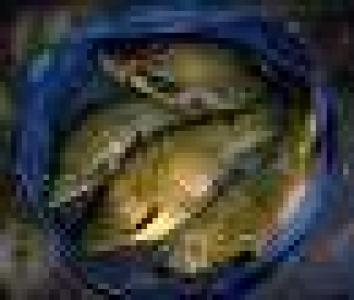

['burrito', 'barracouta', 'grey whale', 'projectile', 'great white shark']


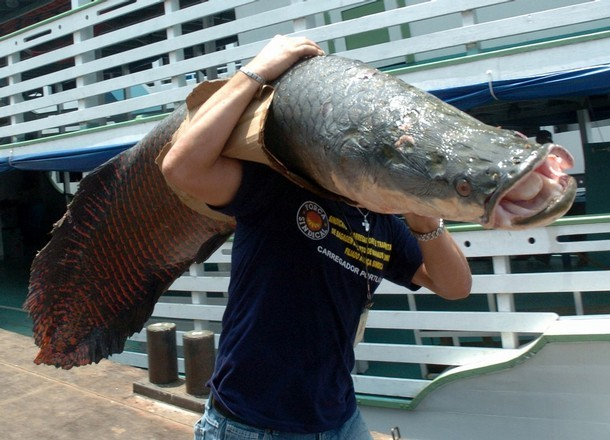

['sturgeon', 'electric ray', 'stingray', 'eel', 'dugong']


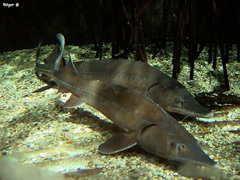

========Gila monster========
Top 5 classes: ['Komodo dragon' 'American alligator' 'common iguana' 'African crocodile'
 'frilled lizard']


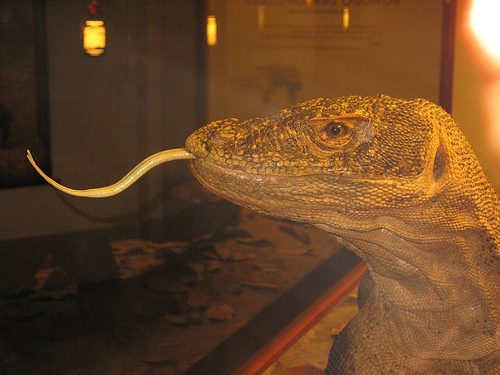

['walking stick', 'mantis', 'green mamba', 'cicada', 'ear']


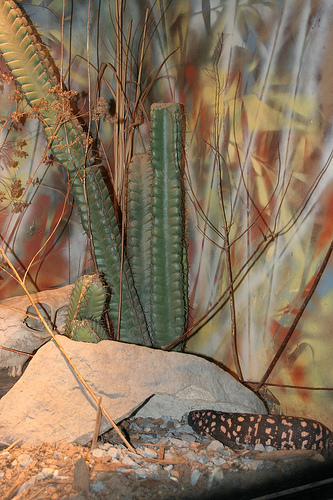

['Komodo dragon', 'common iguana', 'green lizard', 'agama', 'frilled lizard']


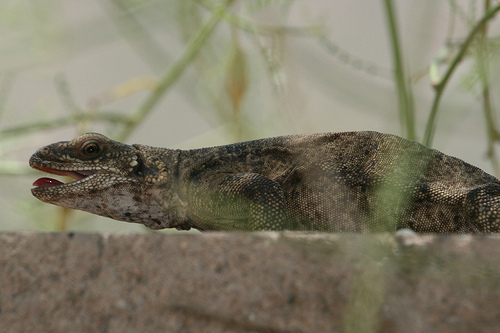

========otterhound========
Top 5 classes: ['Bouvier des Flandres' 'standard poodle' 'Lakeland terrier'
 'Kerry blue terrier' 'komondor']


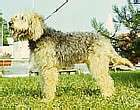

['Tibetan terrier', 'briard', 'Australian terrier', 'silky terrier', 'Yorkshire terrier']


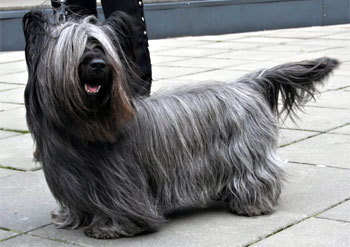

['Irish wolfhound', 'komondor', 'soft-coated wheaten terrier', 'kuvasz', 'fire engine']


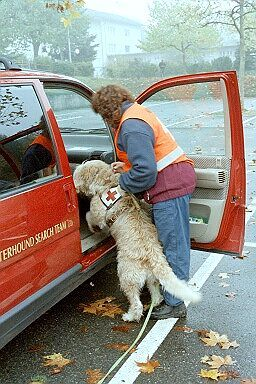

========American black bear========
Top 5 classes: ['wild boar' 'black grouse' 'wombat' 'bison' 'Staffordshire bullterrier']


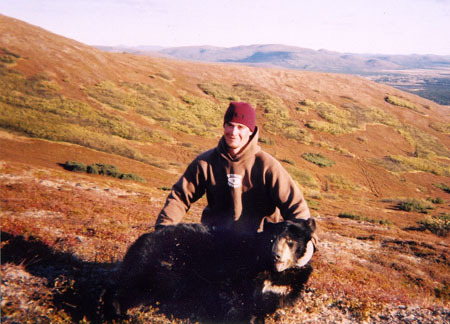

['Scotch terrier', 'Bouvier des Flandres', 'mink', 'giant schnauzer', 'weasel']


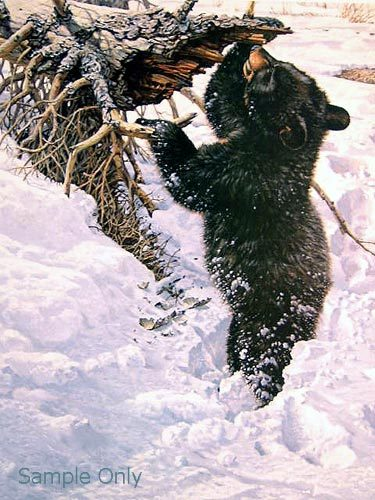

['groenendael', 'horizontal bar', 'giant schnauzer', 'stretcher', 'siamang']


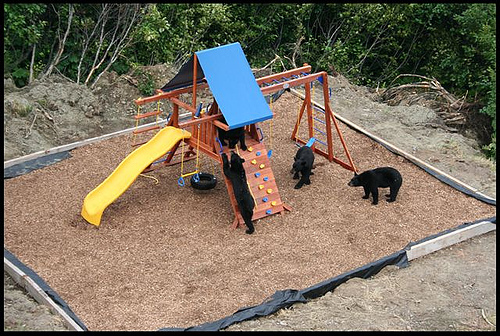

========barracouta========
Top 5 classes: ['gar' 'coho' 'tench' 'sturgeon' 'water snake']


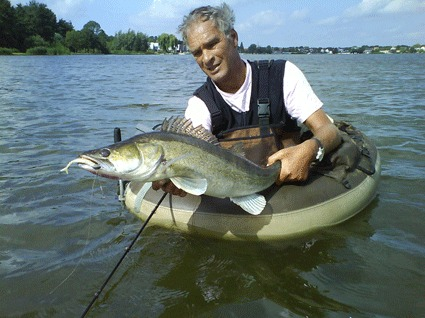

['iron', 'coho', 'tiger shark', 'hammerhead', 'eel']


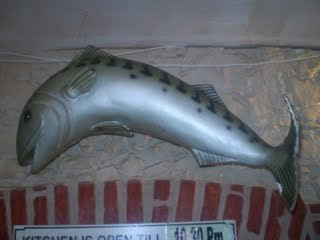

['sturgeon', 'gar', 'tiger shark', 'coho', 'hammerhead']


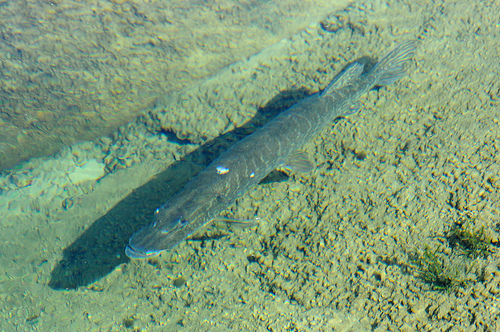

========coil========
Top 5 classes: ['safety pin' 'spindle' 'fig' 'brambling' 'worm fence']


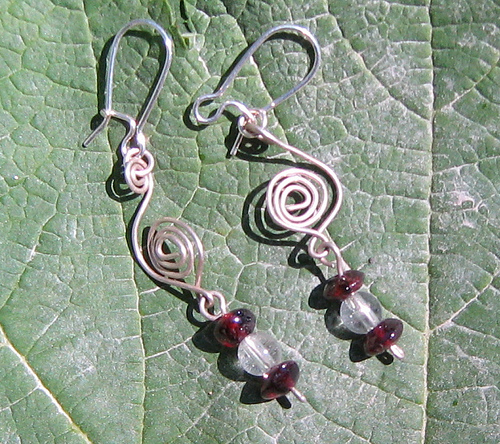

['mantis', 'carousel', 'knot', 'scorpion', 'ear']


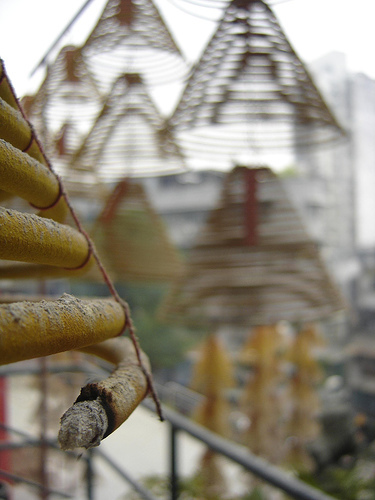

['chain', 'necklace', 'hair slide', 'whistle', 'knot']


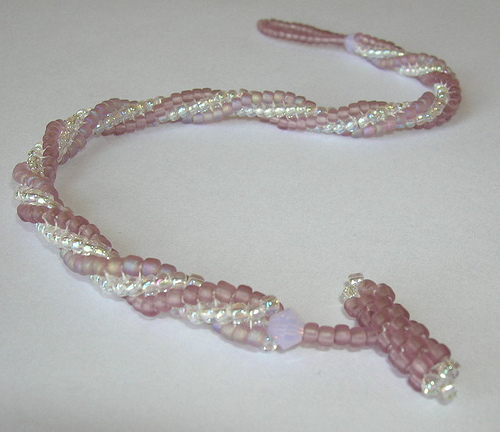

========holster========
Top 5 classes: ['scabbard' 'letter opener' 'cowboy boot' 'pickelhaube' 'violin']


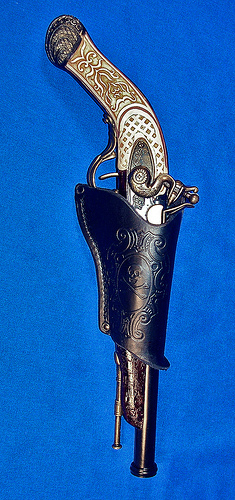

['apiary', 'chain saw', 'revolver', 'rifle', 'lumbermill']


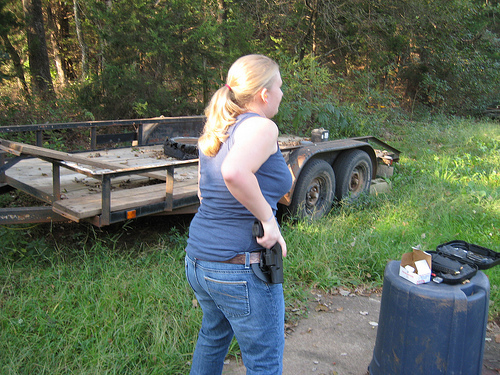

['chain saw', 'plane', 'reel', 'hammer', 'revolver']


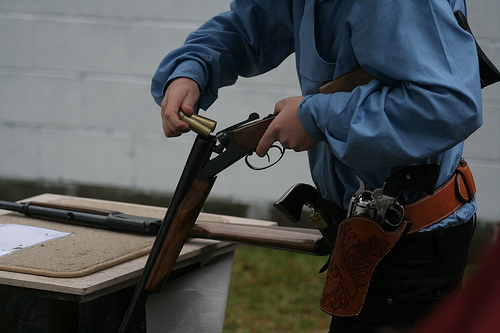

========panpipe========
Top 5 classes: ['marimba' 'fire screen' 'parallel bars' 'accordion' 'washbasin']


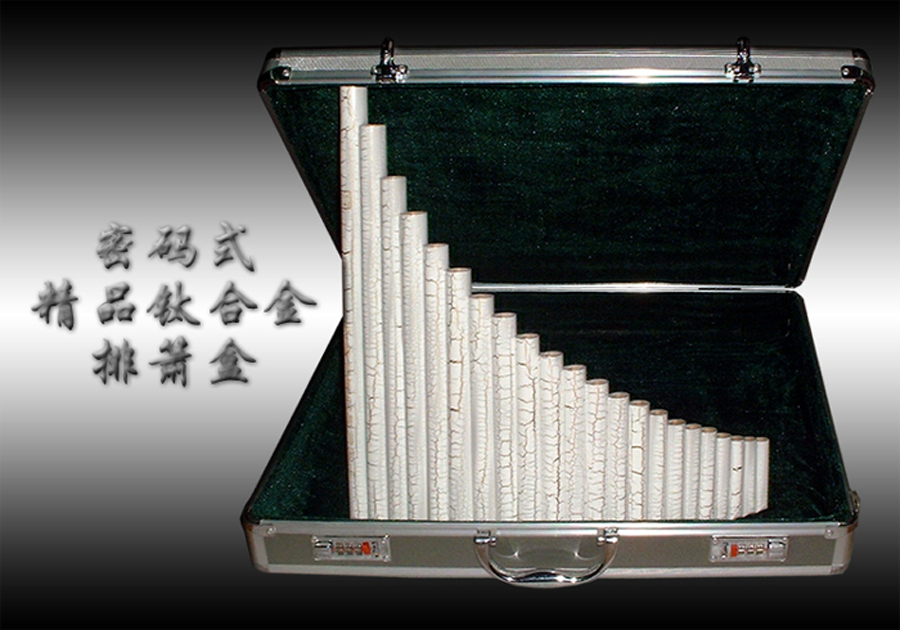

['cornet', 'trombone', 'oboe', 'sax', 'French horn']


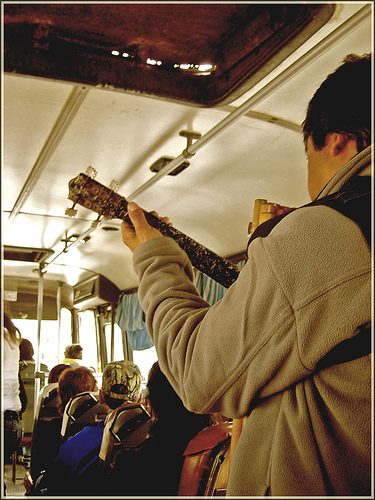

['oboe', 'flute', 'bassoon', 'organ', 'accordion']


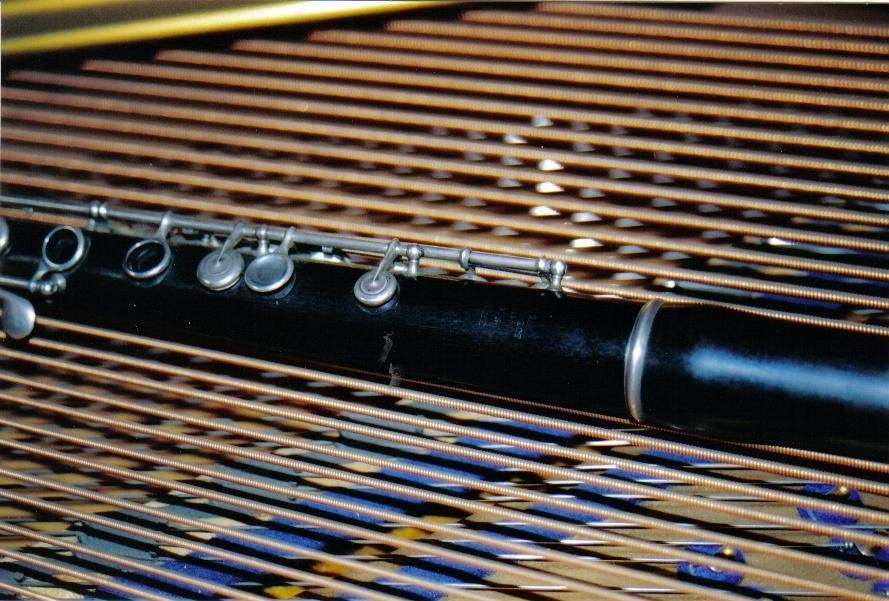

========solar dish========
Top 5 classes: ['coffeepot' 'teapot' 'water jug' 'milk can' 'strainer']


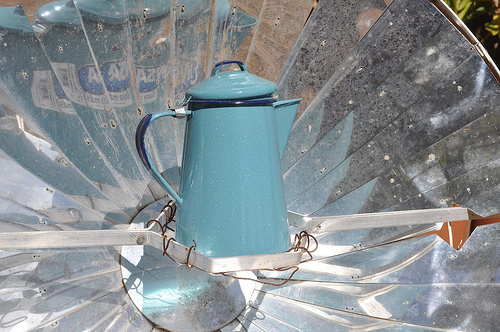

['mobile home', 'boathouse', 'lakeside', 'thresher', 'planetarium']


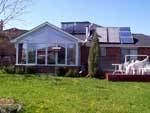

['ashcan', 'bell cote', 'crane', 'garbage truck', 'trailer truck']


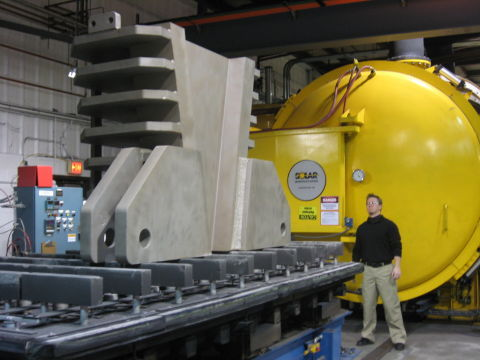

========book jacket========
Top 5 classes: ['window screen' 'sliding door' 'vestment' 'mosquito net' 'binder']


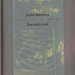

['cassette player', 'hand-held computer', 'web site', 'modem', 'packet']


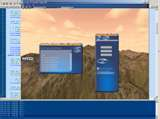

['mask', 'miniskirt', 'envelope', 'mailbox', 'trench coat']


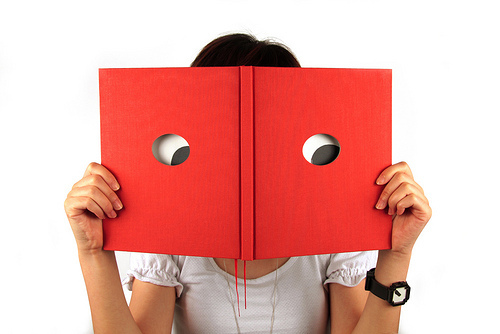

In [11]:
folder_paths = ["/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n01440764", "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n01692333", "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n02091635", "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n02133161", "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n02514041", "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n03065424", "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n03527444", "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n03884397", "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n04258138", "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n07248320"]
class_names = ['tench', 'Gila monster', 'otterhound', 'American black bear', 'barracouta', 'coil', 'holster', 'panpipe', 'solar dish', 'book jacket']
for folder_path, class_name in zip(folder_paths, class_names):
    print("========" + class_name + "========")
    file_names = os.listdir(folder_path)
    image_paths = [os.path.join(folder_path, file) for file in file_names if file.endswith((".jpg", ".jpeg", ".png", "JPEG"))]
    for image_path in image_paths:
      image = preprocess_image(image_path)
      with torch.no_grad():
        image_feature = model.encode_image(image).squeeze()
      similarities = []
      for embedding in class_embeddings:
        dot_product = torch.dot(image_feature, embedding)
        magnitude1 = torch.norm(image_feature)
        magnitude2 = torch.norm(embedding)
        similarity = dot_product / (magnitude1 * magnitude2)
        similarities.append(similarity)
      list_of_tensors_cpu = [tensor.cpu() for tensor in similarities]
      numpy_arrays = [tensor.numpy() for tensor in list_of_tensors_cpu]
      numpy_array = np.stack(numpy_arrays)
      sorted_indices = np.argsort(numpy_array)
      top5_indices = sorted_indices[-1:-6:-1]
      if class_name not in imagenet_classes[top5_indices]:
            print("Top 5 classes:", imagenet_classes[top5_indices])
            display_image(image_path)
            break
    print("=============================================")
    i = 0
    for image_path in image_paths:
        image = Image.open(image_path)
#         if image.size == [3, 224, 224]:
#             continue
        classes, values = predict_ImageNet(image, 5)
        if classes == False:
            continue
        if class_name not in classes:
            print(classes)
            display_image(image_path)
            i += 1
            if i == 2:
                break
    print("=============================================")